In [5]:
import glob, os
import IPython
from IPython.display import HTML
import numpy as np
import pickle

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
fontSize = 27
plt.rcParams.update({'font.size': fontSize})
from matplotlib import cm
import matplotlib.tri as tri

In [6]:
with open("Data_Files/Dataset_Mars.txt", "rb") as myFile:
    data = pickle.load(myFile)
    
print("Observables shape: " + str(data['Observables'].shape))
print("Parameters shape: " + str(data['Parameters'].shape))

paraVec = ['$ log(\eta_{ref})$', '$E$', '$V$', '$\Lambda$', '$T_{ini}$']
obserVec = ['$Q_c$', '$Q_s$', '$R_{th}$', '$D_e$', '$D_{melt}$', '$t_{volc}$'] #"T_{prof, 4.5Gyr}"

fig = plt.figure(figsize=(20,27), dpi=320)
pltCount = 1

for o in range(len(obserVec)+1):
    for p in range(len(paraVec)):
        if o != 6:
            ax = fig.add_subplot(len(obserVec)+1,len(paraVec),pltCount)
            ax.plot(data['Observables'][:,o],data['Parameters'][:,p],'ro',alpha=0.1)
            ax.set_xlabel(obserVec[o])
            ax.set_ylabel(paraVec[p])
            ax.set_xticks([0.0,0.5,1.0])
            ax.set_yticks([0.0,0.5,1.0])
        else:
            vecInterest = data['Parameters'][:,p]
            colorsVec= [plt.cm.jet(i) for i in vecInterest]
            ax = fig.add_subplot(len(obserVec)+1,len(paraVec),pltCount)
            ax.set_prop_cycle('color',colorsVec)
            for i in range(data['Observables'].shape[0]):
                rProf = data['rProf']
                tProf = data['Observables'][i,6:]
                ax.plot(tProf, rProf, linewidth=0.5)
            ax.set_xlabel("T")
            ax.set_ylabel("R")
            ax.set_xticks([0.0,0.5,1.0])
            ax.set_yticks([0.3,0.8,1.3])
            ax.set_title(paraVec[p])
        pltCount += 1
plt.tight_layout()

Observables shape: (6074, 308)
Parameters shape: (6074, 5)


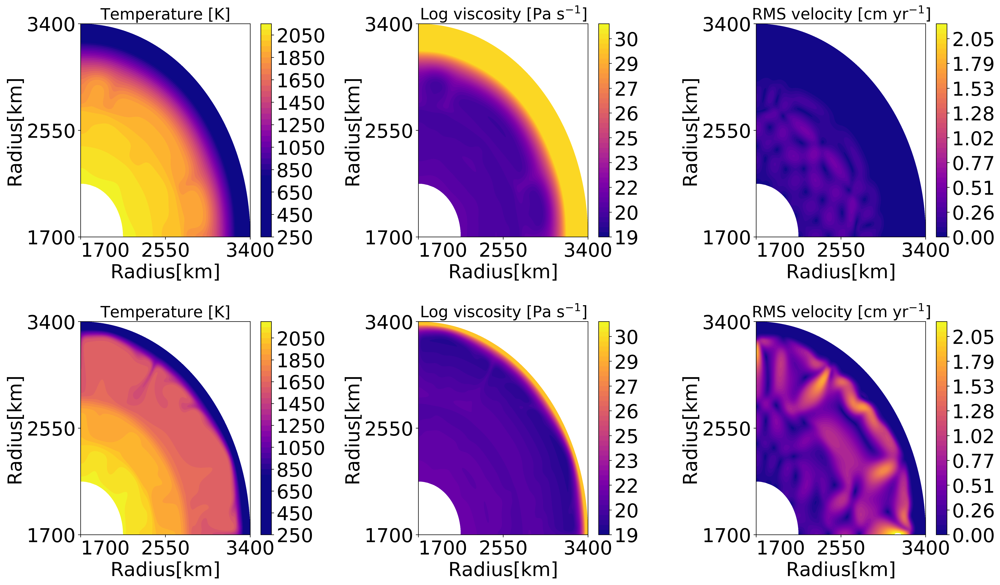

In [7]:
rho_m  = 3500. 
g     = 3.7 
alpha_m = 2.5e-5
T_delta = 2000. 
D = 1700e+3         
k_diffusive = 1e-6 
R = 8.314   
thisWorks = 0
pltCount = 1
numSimulations = 10

indVec = [787, 244] 
numSimulations = len(indVec)
snum = 0
    
fig = plt.figure(figsize=(20,int(numSimulations*6)), dpi=320)
for sInd in indVec:        
    numShells = 302
    numCellsperShell = 394

    x = data["x_ND" + str(sInd)]
    y = data["y_ND" + str(sInd)]

    u = data["u_D" + str(sInd)]
    T = data["T_D" + str(sInd)]
    visc = data["log10_visc_D" + str(sInd)]

    min_radius = x[0] 
    triang = tri.Triangulation(x, y)
    xmid = x[triang.triangles].mean(axis=1)
    ymid = y[triang.triangles].mean(axis=1)
    mask = np.where(xmid*xmid + ymid*ymid < min_radius*min_radius, 1, 0)
    triang.set_mask(mask)

    numLevels = 44
    ax = fig.add_subplot(numSimulations,3,pltCount) 
    ax.locator_params(which="both", tight=True, nbins=3)
    cax = ax.tricontourf(triang, T.flatten(), numLevels, vmin=800 ,cmap="plasma")
    ax.set_title('Temperature [K]', fontsize=22)
    xlabels = ax.get_xticks().tolist()
    ylabels = ax.get_yticks().tolist()
    for lind in range(len(xlabels)):
        xlabels[lind] = int(xlabels[lind]*1700+1700)
    for lind in range(len(ylabels)):
        ylabels[lind] = int(ylabels[lind]*1700+1700)
    ax.set_xticklabels(xlabels)
    ax.set_yticklabels(ylabels)
    ax.set_xlabel('Radius[km]')
    ax.set_ylabel('Radius[km]')
    ax.get_xaxis().majorTicks[0].label1.set_horizontalalignment('left')

    v_min = 19
    v_max = 31
    levels = np.linspace(v_min, v_max, numLevels)
    fig.colorbar(cax, ax=ax)
    pltCount+=1
    ax = fig.add_subplot(numSimulations,3,pltCount) 
    ax.locator_params(which="both", tight=True, nbins=3)
    cax = ax.tricontourf(triang, visc.flatten(), vmin=v_min, vmax=v_max, levels=levels, cmap="plasma")
    ax.set_title('Log viscosity [Pa s$^{-1}$]', fontsize=22)
    xlabels = ax.get_xticks().tolist()
    ylabels = ax.get_yticks().tolist()
    for lind in range(len(xlabels)):
        xlabels[lind] = int(xlabels[lind]*1700+1700)
    for lind in range(len(ylabels)):
        ylabels[lind] = int(ylabels[lind]*1700+1700)
    ax.set_xticklabels(xlabels)
    ax.set_yticklabels(ylabels)
    ax.set_xlabel('Radius[km]')
    ax.set_ylabel('Radius[km]')
    ax.get_xaxis().majorTicks[0].label1.set_horizontalalignment('left')
    cbar = fig.colorbar(cax, ax=ax)
    cbar.ax.set_yticklabels(["{:.0f}".format(i) for i in cbar.get_ticks()])

    v_min = 0.
    v_max = 2.2
    levels = np.linspace(v_min, v_max, numLevels)
    pltCount+=1
    ax = fig.add_subplot(numSimulations,3,pltCount) 
    ax.locator_params(which="both", tight=True, nbins=3)
    cax = ax.tricontourf(triang, u.flatten(), vmin=v_min, vmax=v_max, levels=levels, cmap="plasma")
    ax.set_title('RMS velocity [cm yr$^{-1}$]', fontsize=22)
    xlabels = ax.get_xticks().tolist()
    ylabels = ax.get_yticks().tolist()
    for lind in range(len(xlabels)):
        xlabels[lind] = int(xlabels[lind]*1700+1700)
    for lind in range(len(ylabels)):
        ylabels[lind] = int(ylabels[lind]*1700+1700)
    ax.set_xticklabels(xlabels)
    ax.set_yticklabels(ylabels)
    ax.set_xlabel('Radius[km]')
    ax.set_ylabel('Radius[km]')
    ax.get_xaxis().majorTicks[0].label1.set_horizontalalignment('left')
    cbar = fig.colorbar(cax, ax=ax)
    cbar.ax.set_yticklabels(["{:.2f}".format(i) for i in cbar.get_ticks()])

    pltCount+=1
    snum+=1
plt.tight_layout()
plt.show()